# Análisis de reducción de dimensionalidad: PCA y t-SNE
## Objetivo General
En este trabajo, se busca que pongas en práctica la aplicación de algoritmos de reducción de dimensionalidad. El objetivo es aplicar técnicas para reducir la dimensionalidad a 2D, graficar los resultados y seleccionar la mejor técnica para los datos. Además, deberás detallar los pasos a seguir para la reducción de dimensionalidad y analizar los resultados obtenidos.

### Objetivos específicos 
* Entender los métodos de t-SNE y PCA.
* Realizar la reducción de dimensionalidad utilizando t-SNE y PCA.
* Comparar los resultados obtenidos con ambos métodos.
* Aplicar LDA para reducir el dataset a una bolsa de palabras por cada etiqueta.

### Dataset

#### Dataset

El dataset original proporcionado en el proyecto transversal ha sido adaptado para la realización de esta actividad. Esa adaptación ha incluido:
* Eliminación de nulos y duplicados
* Eliminación de URLs, emojis y menciones a los periódicos
* Eliminación de filas vacías
* Limpieza y homogeneización de datos.
* Convertir la totalidad del texto a minúscula
* Eliminar signos de puntuación
* Eliminar números
* Eliminar espacios en blanco adicionales
* Eliminar palabras con longitud menor a 2 caracteres
* Eliminar stopwords
* Tokenización
* Lematización

Proceso de extracción de características
* Conteo de palabras positivas (A)
* Conteo de palabras negativas (B)
* Conteo del número de bigrams más comunes (C)
* Conteo del número de menciones a otros usuarios (D)
* Categoría del sentimiento según librería ‘pysentimiento’ en español (E)
* Estandarización de las características (A_t,..E_t)
* Combinación de características f1*fi (iA..iE) (Valor1,..Valor10).

### Imports

In [34]:
!pip install pyLDAvis

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/59.0 kB ? eta -:--:--
     ---------------------------------- ----- 51.2/59.0 kB 1.3 MB/s eta 0:00:01
     ---------------------------------------- 59.0/59.0 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
INFO: pip is looking at multiple versions of pyfume to determine which version is compatible with other requirements. This could take a while.
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/2.6 MB ? eta -:--:--
    --------------------------------------- 0.1/2.6 MB 3.2 MB/s eta 0:00:01
   -- ------------------------------------- 0.2/2.6 MB 2.3 MB/s eta 0:00:02
   ---- ----------------------------------- 0.3/2.6 MB 2.5 MB/s eta 0:00:01
   ------ --------------------------------- 0.

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis


### Lectura de datos

In [ ]:
# Leer el archivo CSV
file_path = 'out.csv'
data = pd.read_csv(file_path)

# Obtener el número de filas y columnas
num_filas, num_columnas = data.shape

# Mostrar el número de filas y columnas
print(f"El dataset tiene {num_filas} filas y {num_columnas} columnas.")

El dataset tiene 10000 filas y 22 columnas.


In [4]:
##Cuántas categorías hay en la columna label
# Contar el número de categorías únicas en la columna 'label'
valores_unicos = data['label'].unique()
print(f'Número de categorías únicas: {valores_unicos.size}')
valores_unicos


Número de categorías únicas: 2


array([0., 1.])

In [5]:
# Obtener estadísticas descriptivas de las variables numéricas

data.describe()

,A,B,C,D,E,label,A_t,B_t,C_t,D_t,...,Valor_1,Valor_2,Valor_3,Valor_4,Valor_5,Valor_6,Valor_7,Valor_8,Valor_9,Valor_10
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.957400,26.098100,5.674600,0.091300,2.200600,0.500000,0.735989,0.895389,1.014276,-0.241571,...,2.448370,2.515129,-0.222304,-0.324603,3.343632,-0.302639,-0.756762,-0.286422,-0.357238,-0.050935
std,1.741864,34.012341,7.317149,0.352671,2.729488,0.500025,1.863010,1.672944,1.844389,0.676008,...,8.690527,9.827254,1.160914,1.547278,10.567912,1.045447,0.885760,1.218960,1.297408,1.129825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.287998,-0.388282,-0.416086,-0.416577,...,-2.197166,-3.582457,-10.573231,-11.207779,-1.393841,-6.558948,-8.362074,-9.067027,-11.559651,-5.886890
25%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-0.287998,-0.339096,-0.164022,-0.416577,...,-0.086494,-0.097950,-0.432068,-0.686619,-0.025057,-0.760297,-0.943189,-0.561697,-0.716113,-0.993166
50%,0.000000,5.000000,3.000000,0.000000,0.000000,0.500000,-0.287998,-0.142350,0.340105,-0.416577,...,0.097659,0.047238,0.119973,-0.415081,0.063687,-0.043150,-0.808442,-0.141680,-0.314500,0.221244
75%,1.000000,46.000000,7.000000,0.000000,6.000000,1.000000,0.781552,1.874292,1.348361,-0.416577,...,1.157323,0.659812,0.119973,0.152955,2.527222,0.141260,-0.314174,0.068328,0.087112,0.221244
max,24.000000,328.000000,88.000000,6.000000,6.000000,1.000000,25.381200,15.744855,21.765536,11.084360,...,332.263677,246.545947,21.283302,60.511589,331.989523,20.009412,19.361276,28.053013,23.045933,17.286505


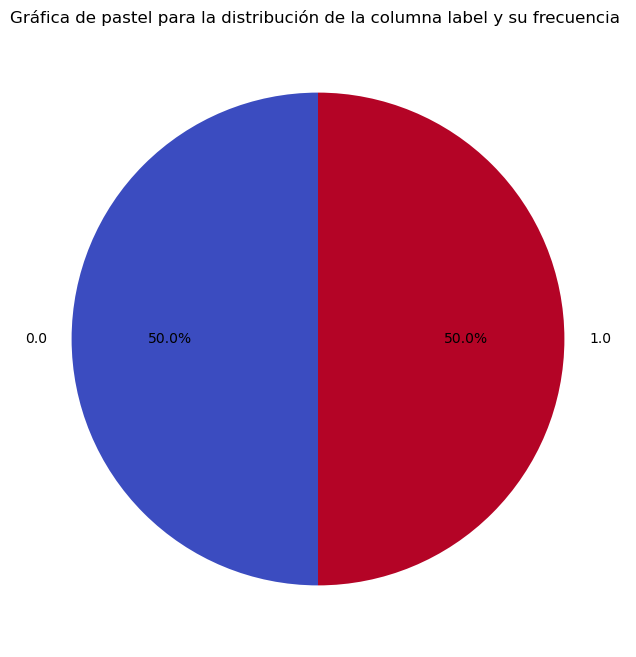

In [6]:
# frecuencia de las categorías en la columna 'label'
datos_unicos_label = data['label'].value_counts()

# gráfica de pastel
plt.figure(figsize=(8, 8))
datos_unicos_label.plot.pie(autopct='%1.1f%%', startangle=90, cmap='coolwarm')
plt.title(f'Gráfica de pastel para la distribución de la columna label y su frecuencia ')
plt.ylabel('')
plt.show()


La frecuencia de las categorías en la etiqueta label esta perfectamente equilibrada con 50% de los datos para cada una de las categorías 

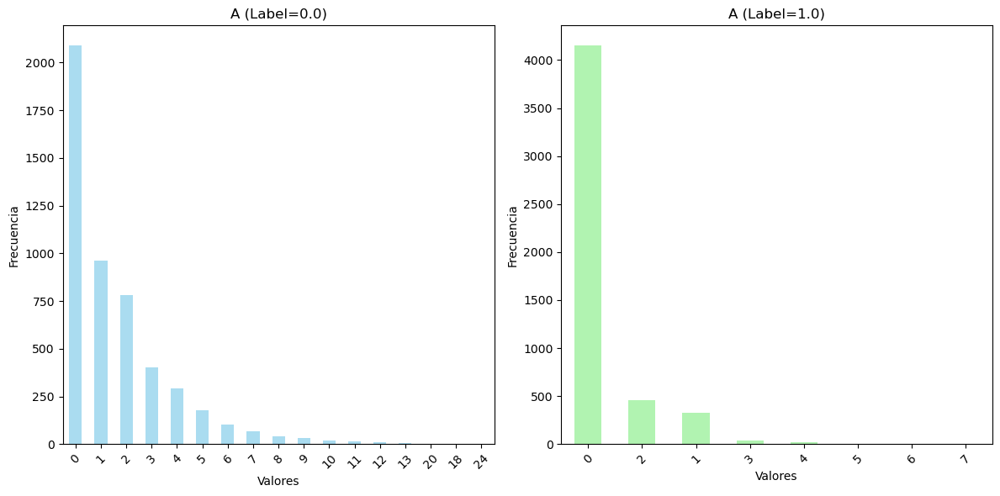

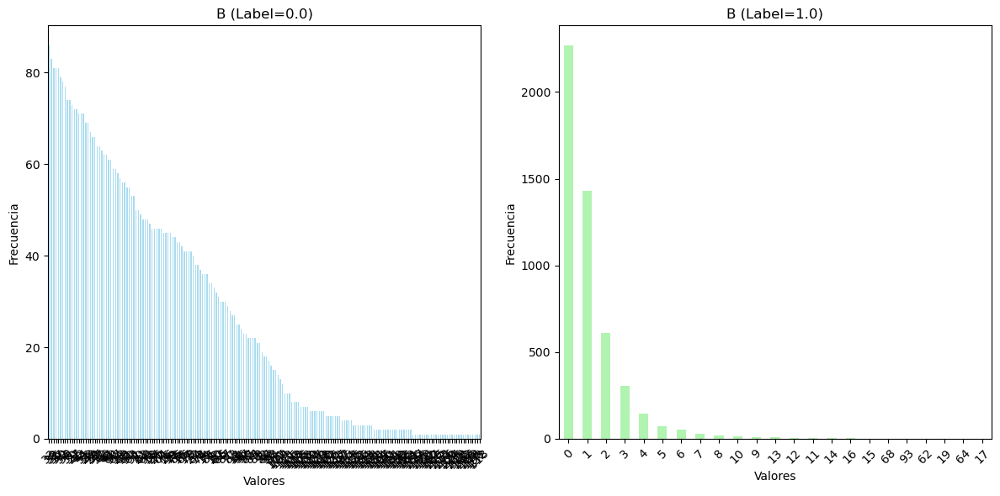

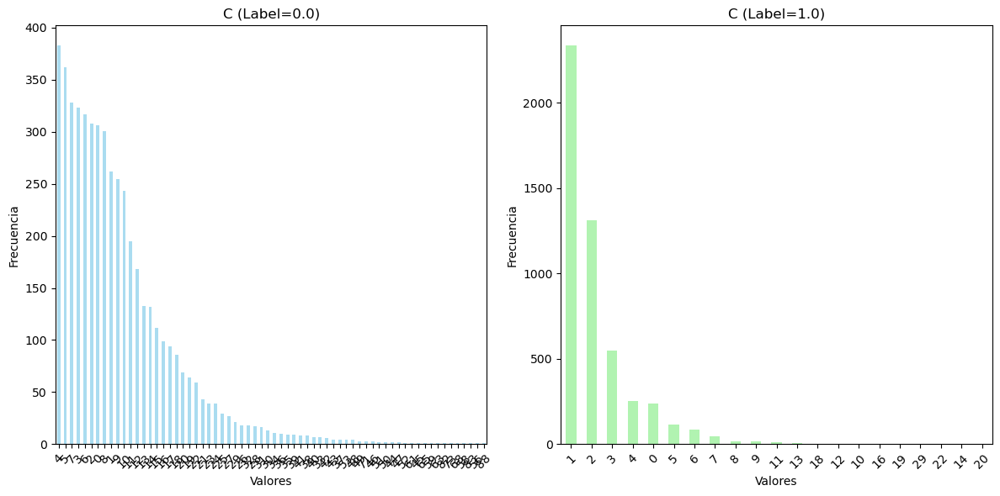

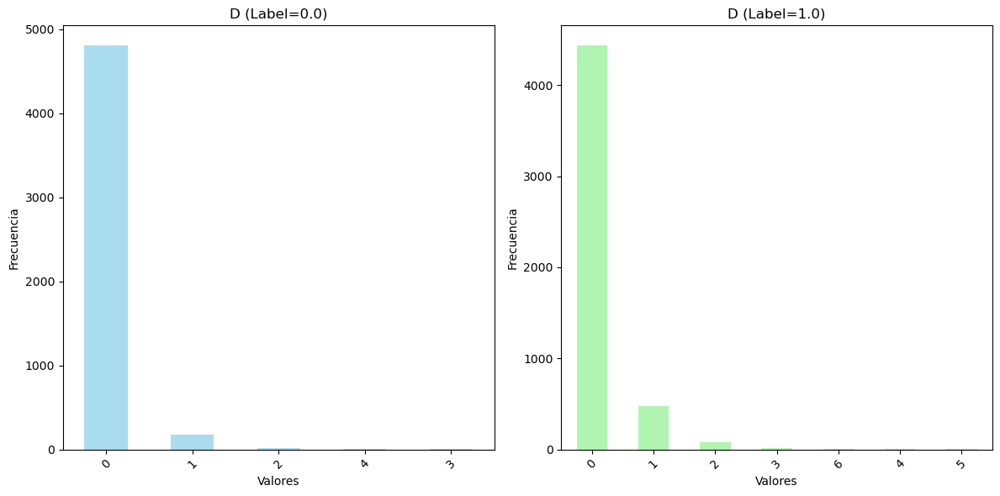

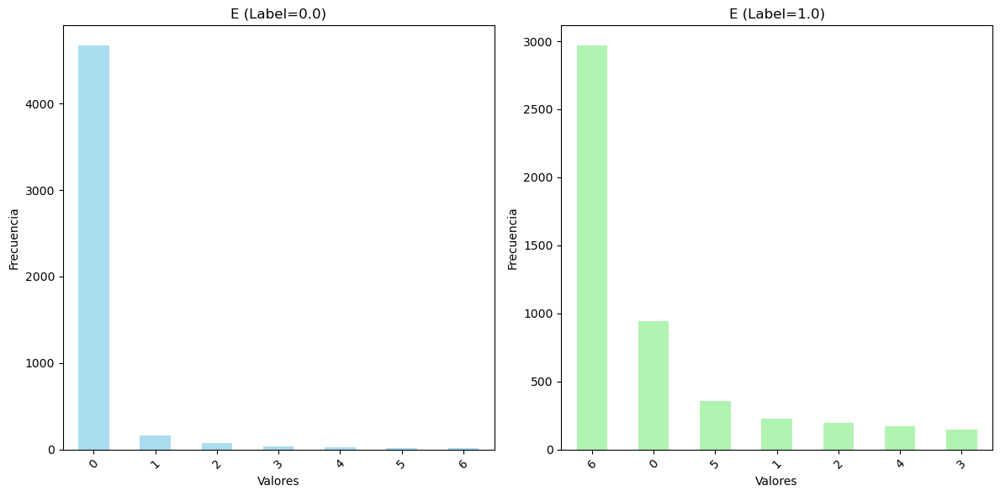

In [7]:
# Mostrar las estadísticas y la frecuencia de las categorías
# Recorre cada columna (excepto la de label) y crea gráficos
for col in data.columns:
    if col != 'label':  # Ignora la columna de etiquetas
        plt.figure(figsize=(12, 6))

        # Filtro para cada categoría de la columna 'label'
        for i, categoria in enumerate(valores_unicos):
            plt.subplot(1, 2, i + 1)  # Una fila, dos gráficos por columna
            subset = data[data['label'] == categoria][col]  # Datos de esa categoría
            subset.value_counts().plot(kind='bar', color='skyblue' if categoria == 0 else 'lightgreen', alpha=0.7)
            plt.title(f'{col} (Label={categoria})')
            plt.xlabel('Valores')
            plt.ylabel('Frecuencia')
            plt.xticks(rotation=45)
        
        # Espaciado entre los gráficos
        plt.tight_layout()
        plt.show()
        if col == 'E': break


La distribución de las categorías en la columna label, en relación con las demás columnas que reflejan características del sentimiento, evidencia una diferencia en la cantidad de registros para cada valor para cada columna. Esto sugiere que cada clase de la columna label posee características distintivas, lo que convierte a un modelo de aprendizaje automatizado en una opción viable para abordar este caso.

La columna E representa una codificación del sentimiento del mensaje dato que ya tenemos representado por la columna label, antes de borrar esta columna veamos como esta representación se equivale al etiquetado. Aplicando primero de todo un on hot encoding de la columna para poder compara correctamente

In [8]:
# Aplicar one hot encoding a la columna 'E'
data_encode = pd.get_dummies(data['E'], prefix='E')
data = pd.concat([data, data_encode], axis=1)
data.head()

,A,B,C,D,E,comentario,label,A_t,B_t,C_t,...,Valor_8,Valor_9,Valor_10,E_0,E_1,E_2,E_3,E_4,E_5,E_6
0,2,64,30,0,2,"pandemia,originado,covid,cierto,incidencia,aba...",0.0,1.851102,2.759647,7.145831,...,-2.976790,3.148722,-0.183560,False,False,True,False,False,False,False
1,4,70,21,0,0,"ser,mes,larga,espera,llegar,momento,siempre,pr...",0.0,3.990202,3.054765,4.877255,...,-2.031754,-2.590305,0.221244,True,False,False,False,False,False,False
2,4,88,50,0,0,"cartagena,san,sebastiar,fuengirola,irun,orense...",0.0,3.990202,3.940120,12.187108,...,-5.076872,-6.472559,0.221244,True,False,False,False,False,False,False
3,3,38,21,0,0,"pleno,dia,verano,calor,plan,mas,apetecibl,disf...",0.0,2.920652,1.480801,4.877255,...,-2.031754,-2.590305,0.221244,True,False,False,False,False,False,False
4,0,59,17,0,0,"pasado,junio,celebro,dia,luchar,frente,leishma...",0.0,-0.287998,2.513715,3.869000,...,-1.611737,-2.054821,0.221244,True,False,False,False,False,False,False


In [9]:
# Convertir 'label' a tipo int
data['label'] = data['label'].astype(int)

# Convertir las columnas E_0 a E_6 de tipo boolean a int (0 o 1)
data[['E_0', 'E_1', 'E_2', 'E_3', 'E_4', 'E_5', 'E_6']] = data[['E_0', 'E_1', 'E_2', 'E_3', 'E_4', 'E_5', 'E_6']].astype(int)

display(data.info())
display(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   A           10000 non-null  int64  
 1   B           10000 non-null  int64  
 2   C           10000 non-null  int64  
 3   D           10000 non-null  int64  
 4   E           10000 non-null  int64  
 5   comentario  10000 non-null  object 
 6   label       10000 non-null  int32  
 7   A_t         10000 non-null  float64
 8   B_t         10000 non-null  float64
 9   C_t         10000 non-null  float64
 10  D_t         10000 non-null  float64
 11  E_t         10000 non-null  float64
 12  Valor_1     10000 non-null  float64
 13  Valor_2     10000 non-null  float64
 14  Valor_3     10000 non-null  float64
 15  Valor_4     10000 non-null  float64
 16  Valor_5     10000 non-null  float64
 17  Valor_6     10000 non-null  float64
 18  Valor_7     10000 non-null  float64
 19  Valor_8     10000 non-null

None

,A,B,C,D,E,comentario,label,A_t,B_t,C_t,...,Valor_8,Valor_9,Valor_10,E_0,E_1,E_2,E_3,E_4,E_5,E_6
0,2,64,30,0,2,"pandemia,originado,covid,cierto,incidencia,aba...",0,1.851102,2.759647,7.145831,...,-2.976790,3.148722,-0.183560,0,0,1,0,0,0,0
1,4,70,21,0,0,"ser,mes,larga,espera,llegar,momento,siempre,pr...",0,3.990202,3.054765,4.877255,...,-2.031754,-2.590305,0.221244,1,0,0,0,0,0,0
2,4,88,50,0,0,"cartagena,san,sebastiar,fuengirola,irun,orense...",0,3.990202,3.940120,12.187108,...,-5.076872,-6.472559,0.221244,1,0,0,0,0,0,0
3,3,38,21,0,0,"pleno,dia,verano,calor,plan,mas,apetecibl,disf...",0,2.920652,1.480801,4.877255,...,-2.031754,-2.590305,0.221244,1,0,0,0,0,0,0
4,0,59,17,0,0,"pasado,junio,celebro,dia,luchar,frente,leishma...",0,-0.287998,2.513715,3.869000,...,-1.611737,-2.054821,0.221244,1,0,0,0,0,0,0


<h2> Distribución de los datos </h2>

A continuación se analizan las distribuciones de todas las variables numéricas y categóricas de los datos en histogramas así como la grafica de bigotes de gato para la detección de posibles outliers.

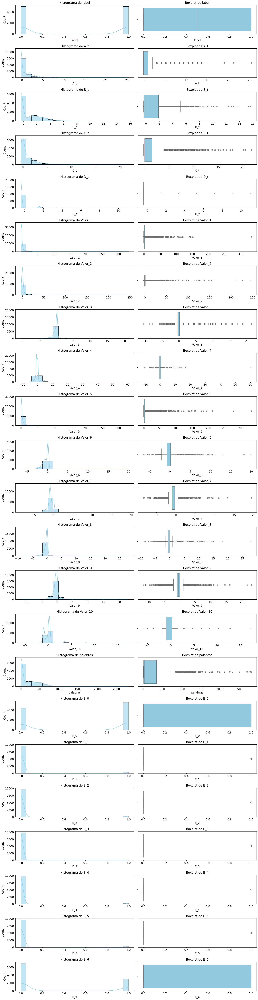

In [ ]:
# Preparamos una figura de m x n
mpl.rc('font', size=14)
mpl.rc('axes', titlesize=15)

# Creamos una figura de m x n
figure, axes = plt.subplots(nrows=len(data.columns), ncols=2)

# Ajustamos el tamaño de la figura en función del número de columnas
figure_height = len(data.columns) * 3  # Incrementamos el tamaño vertical
figure.set_size_inches(18, figure_height)  # Ajusta la altura proporcionalmente

for row, column in enumerate(data.columns):
    sns.histplot(data[column], ax=axes[row, 0], kde=True, bins=20, color='skyblue')
    axes[row, 0].set(title=f'Histograma de {column}')
    axes[row, 0].set_xlabel(column)

    sns.boxplot(x=data[column], ax=axes[row, 1], color='skyblue')
    axes[row, 1].set(title=f'Boxplot de {column}')
    axes[row, 1].set_xlabel(column)

# Ajustamos automáticamente la disposición de las subtramas
plt.tight_layout()

plt.show()

Entre las columnas nuevas del one hot encoding de la columna **E**, se observa que hay dos categorías que tienen una distribución binomial con valores en ambos lados. Al agrupar estos valores con la columna **label** que determina si la frase contiene odio (**label** = 1) o no (**label** = 0), se observa que **E_6** es más representativa de la categoría de Odio, por lo que se puede interpretar como la categoría de **sentimiento negativo**. Por otro lado, **E_0** tiene una mayor representación de valores sin Odio, por lo que se presenta como la etiqueta de **sentimiento positivo**.

In [10]:
# Agrupamos por 'E_' y 'label' y contar los registros
conteo_registros = data.groupby(['E_0', 'E_1', 'E_2', 'E_3', 'E_4', 'E_5', 'E_6', 'label']).size().reset_index(name='count')

print(conteo_registros)

    E_0  E_1  E_2  E_3  E_4  E_5  E_6  label  count
0     0    0    0    0    0    0    1      0     17
1     0    0    0    0    0    0    1      1   2967
2     0    0    0    0    0    1    0      0     19
3     0    0    0    0    0    1    0      1    354
4     0    0    0    0    1    0    0      0     23
5     0    0    0    0    1    0    0      1    171
6     0    0    0    1    0    0    0      0     34
7     0    0    0    1    0    0    0      1    144
8     0    0    1    0    0    0    0      0     73
9     0    0    1    0    0    0    0      1    196
10    0    1    0    0    0    0    0      0    163
11    0    1    0    0    0    0    0      1    226
12    1    0    0    0    0    0    0      0   4671
13    1    0    0    0    0    0    0      1    942


Podemos ver un desajuste con las etiquetas con el resultado del modelo pysentimiento dado que tenemos una buena base donde el valor 1 de la columna E corresponde con el valor 0 de mensajes de no Odio y para el resto de valores corresponderían mas cercano al valor 0 de mensajes con odio. Por este motivo es mejor eliminar esta columna.

In [11]:
# Eliminar las columnas
data = data.drop(columns=['E_0', 'E_1', 'E_2', 'E_3', 'E_4', 'E_5', 'E_6', 'E'])


c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

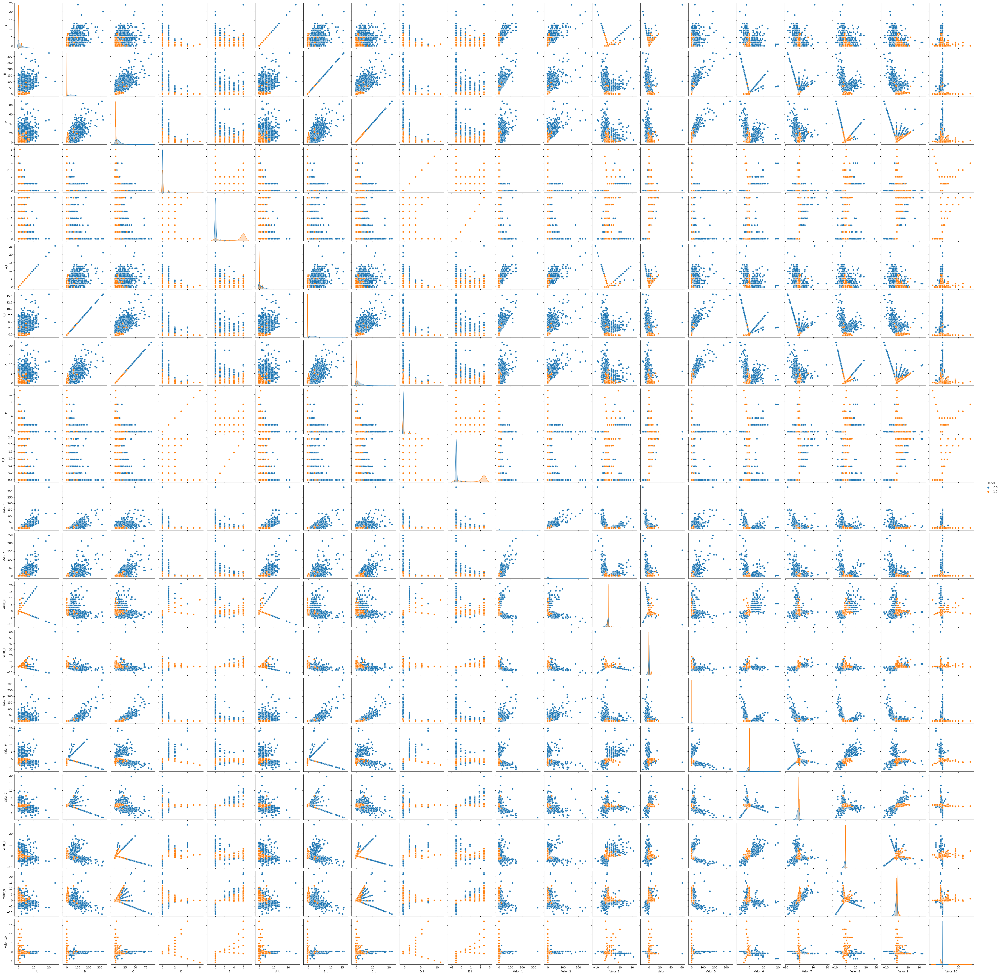

In [11]:
# Crear una matriz de gráficos de dispersión (pairplot)
sns.pairplot(data, hue='label', diag_kind='kde') 
plt.show()

In [12]:
data.describe()

,A,B,C,D,label,A_t,B_t,C_t,D_t,E_t,Valor_1,Valor_2,Valor_3,Valor_4,Valor_5,Valor_6,Valor_7,Valor_8,Valor_9,Valor_10
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.957400,26.098100,5.674600,0.091300,0.500000,0.735989,0.895389,1.014276,-0.241571,0.538103,2.448370,2.515129,-0.222304,-0.324603,3.343632,-0.302639,-0.756762,-0.286422,-0.357238,-0.050935
std,1.741864,34.012341,7.317149,0.352671,0.500025,1.863010,1.672944,1.844389,0.676008,1.326172,8.690527,9.827254,1.160914,1.547278,10.567912,1.045447,0.885760,1.218960,1.297408,1.129825
min,0.000000,0.000000,0.000000,0.000000,0.000000,-0.287998,-0.388282,-0.416086,-0.416577,-0.531099,-2.197166,-3.582457,-10.573231,-11.207779,-1.393841,-6.558948,-8.362074,-9.067027,-11.559651,-5.886890
25%,0.000000,1.000000,1.000000,0.000000,0.000000,-0.287998,-0.339096,-0.164022,-0.416577,-0.531099,-0.086494,-0.097950,-0.432068,-0.686619,-0.025057,-0.760297,-0.943189,-0.561697,-0.716113,-0.993166
50%,0.000000,5.000000,3.000000,0.000000,0.500000,-0.287998,-0.142350,0.340105,-0.416577,-0.531099,0.097659,0.047238,0.119973,-0.415081,0.063687,-0.043150,-0.808442,-0.141680,-0.314500,0.221244
75%,1.000000,46.000000,7.000000,0.000000,1.000000,0.781552,1.874292,1.348361,-0.416577,2.384111,1.157323,0.659812,0.119973,0.152955,2.527222,0.141260,-0.314174,0.068328,0.087112,0.221244
max,24.000000,328.000000,88.000000,6.000000,1.000000,25.381200,15.744855,21.765536,11.084360,2.384111,332.263677,246.545947,21.283302,60.511589,331.989523,20.009412,19.361276,28.053013,23.045933,17.286505


Se elimina las columna innecesarias, pero antes se añade el conteo de palabras como una columna nueva y se separa en dos dataset uno con el conteo y otro sin para así hacer una comparación y mantener una característica importante de los comentarios.

In [12]:
# Eliminar columnas que empiecen por 'Valor_' y la columna 'comentario'
data = data.drop(columns=['A_t', 'B_t', 'C_t', 'D_t', 'E_t', 
                          'Valor_1', 'Valor_2', 'Valor_3', 'Valor_4', 
                          'Valor_5', 'Valor_6', 'Valor_7', 'Valor_8', 
                          'Valor_9', 'Valor_10'])
# Crear columnas nuevas
data['palabras'] = data['comentario'].apply(lambda x: len(x.split(',')))
data = data.drop(columns=['comentario'])
data_noWords = data.drop(columns=['palabras'])
# Mostrar las primeras filas del nuevo dataframe para verificar
data.head()


,A,B,C,D,label,palabras
0,2,64,30,0,0,444
1,4,70,21,0,0,481
2,4,88,50,0,0,714
3,3,38,21,0,0,324
4,0,59,17,0,0,438


In [13]:
data_noWords.head()

,A,B,C,D,label
0,2,64,30,0,0
1,4,70,21,0,0
2,4,88,50,0,0
3,3,38,21,0,0
4,0,59,17,0,0


In [14]:
# Estandarizar las columnas, excepto 'label'
label_data = data['label']
data_features = data.drop(columns=['label'])

# Estandarizar las columnas excepto 'label'
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_features)

# Crear un nuevo DataFrame con las columnas estandarizadas y la 'label' intacta
data = pd.DataFrame(data_scaled, columns=data_features.columns)
data['label'] = label_data

# Dataset: data_noWords
# Separar la columna 'label' del resto
label_data_noWords = data_noWords['label']
data_noWords_features = data_noWords.drop(columns=['label'])

# Estandarizar las columnas excepto 'label'
data_noWords_scaled = scaler.fit_transform(data_noWords_features)

# Crear un nuevo DataFrame con las columnas estandarizadas y la 'label' intacta
data_noWords = pd.DataFrame(data_noWords_scaled, columns=data_noWords_features.columns)
data_noWords['label'] = label_data_noWords

# Verificar los resultados
print(data.head())

          A         B         C         D  palabras  label
0  0.598584  1.114413  3.324603 -0.258895  0.948820      0
1  1.746837  1.290828  2.094554 -0.258895  1.091045      0
2  1.746837  1.820075  6.058045 -0.258895  1.986675      0
3  1.172711  0.349946  2.094554 -0.258895  0.487551      0
4 -0.549669  0.967400  1.547866 -0.258895  0.925757      0


In [15]:

print(data_noWords.head())

          A         B         C         D  label
0  0.598584  1.114413  3.324603 -0.258895      0
1  1.746837  1.290828  2.094554 -0.258895      0
2  1.746837  1.820075  6.058045 -0.258895      0
3  1.172711  0.349946  2.094554 -0.258895      0
4 -0.549669  0.967400  1.547866 -0.258895      0


In [16]:
# Separar las características y las etiquetas

X_data = data.drop(columns=['label'])  # Características (features)
y_data = data['label']                # Etiquetas (labels)

# Separar características y etiquetas en 'data_noWords'
X_data_noWords = data_noWords.drop(columns=['label'])  # Características (features)
y_data_noWords = data_noWords['label']                # Etiquetas (labels)

# Verificar las dimensiones de las características y etiquetas
print("Dimensiones de data:")
print("Características (X_data):", X_data.shape)
print("Etiquetas (y_data):", y_data.shape)

print("\nDimensiones de data_noWords:")
print("Características (X_data_noWords):", X_data_noWords.shape)
print("Etiquetas (y_data_noWords):", y_data_noWords.shape)



Dimensiones de data:
Características (X_data): (10000, 5)
Etiquetas (y_data): (10000,)

Dimensiones de data_noWords:
Características (X_data_noWords): (10000, 4)
Etiquetas (y_data_noWords): (10000,)


### Random forest con los datos sin tratar la dimensionalidad


Evaluación del modelo para el dataset data:
Precisión del modelo: 0.9755

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1012
           1       0.97      0.98      0.98       988

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



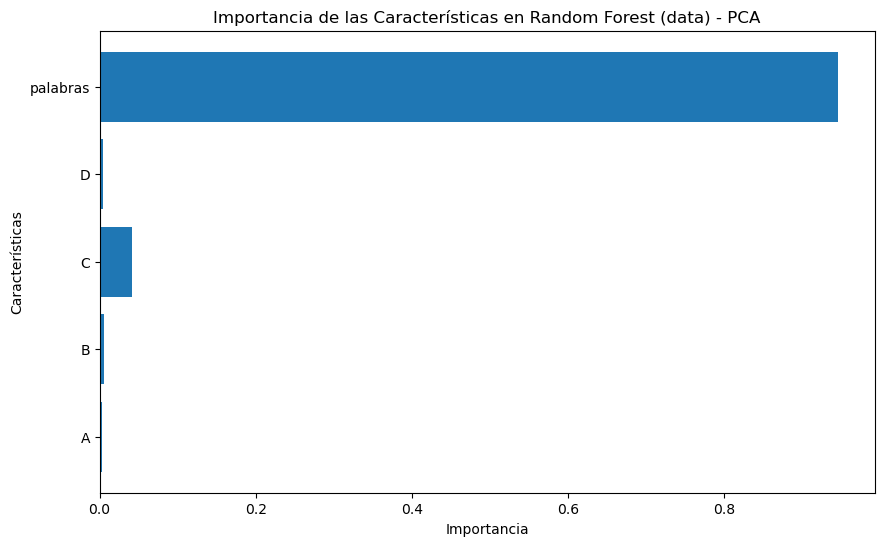


Evaluación del modelo para el dataset data_noWords:
Precisión del modelo: 0.973

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.99      0.96      0.97      1012
           1       0.96      0.99      0.97       988

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000



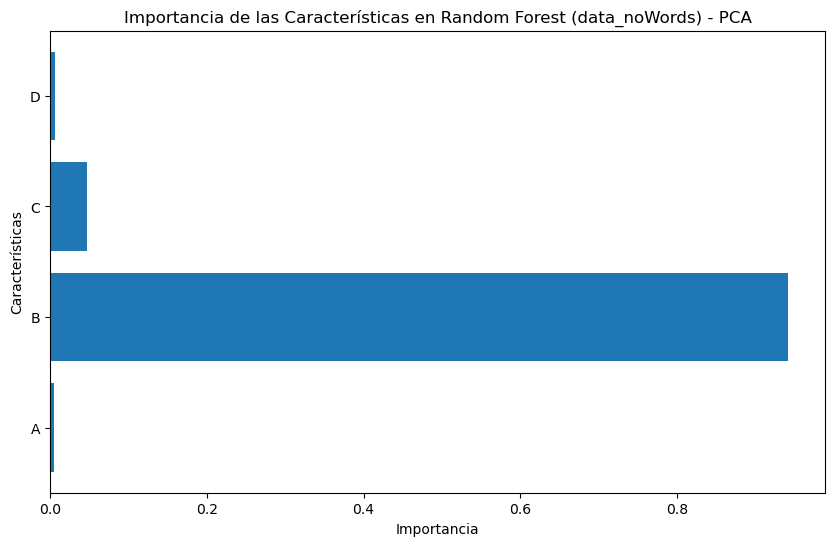

In [17]:
# Función para entrenar, predecir y evaluar el modelo 
def entrenar_evaluar_modelo_rf(df_rf, y, dataset_name):
    # Dividir los datos en conjunto de entrenamiento y prueba (80% entrenamiento, 20% prueba)
    X_train, X_test, y_train, y_test = train_test_split(df_rf.drop(columns=['label']), y, test_size=0.2, random_state=42)

    particion = 'gini'
    max_depth = 10
    min_samples_split = 10
    min_samples_leaf = 2

    # Entrenar el modelo de clasificación RandomForest
    modelo_rf = RandomForestClassifier(n_estimators = i, criterion= particion,
                                       max_depth = max_depth, min_samples_split = min_samples_split,
                                      min_samples_leaf = min_samples_leaf, max_features =None)
    modelo_rf.fit(X_train, y_train)

    # Realizar las predicciones sobre el conjunto de prueba
    y_pred = modelo_rf.predict(X_test)

    # Evaluar el modelo
    print(f"\nEvaluación del modelo para el dataset {dataset_name}:")
    print("Precisión del modelo:", accuracy_score(y_test, y_pred))
    print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

    # Importancia de las características
    importancias = modelo_rf.feature_importances_
    caracteristicas = X_train.columns

    # Graficar la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.barh(caracteristicas, importancias)
    plt.title(f"Importancia de las Características en Random Forest ({dataset_name}) - PCA")
    plt.xlabel("Importancia")
    plt.ylabel("Características")
    plt.show()

# Evaluar el modelo en el dataset 'data'
entrenar_evaluar_modelo_rf(data, y_data, "data")

# Evaluar el modelo en el dataset 'data_noWords'
entrenar_evaluar_modelo_rf(data_noWords, y_data_noWords, "data_noWords")

### PCA

In [18]:
# Aplicar PCA

# Crear un DataFrame con los resultados de PCA

def aplicar_pca(X, y, n_componentes):
    # Crear el modelo PCA
    pca = PCA(n_components=n_componentes)
    
    # Ajustar y transformar las características
    componentes_principales = pca.fit_transform(X)
    
    # Crear un DataFrame con los resultados
    df_pca = pd.DataFrame(componentes_principales, columns=[f'PC{i+1}' for i in range(n_componentes)])
    
    # Añadir las etiquetas al DataFrame
    df_pca['label'] = y.reset_index(drop=True)
    
    return df_pca, pca


n_componentes = 2 

# Aplicar PCA al dataset 'data'
df_pca_data, pca_data = aplicar_pca(X_data, y_data, n_componentes)

# Aplicar PCA al dataset 'data_noWords'
df_pca_data_noWords, pca_data_noWords = aplicar_pca(X_data_noWords, y_data_noWords, n_componentes)

# Verificar los resultados
print("Resultados PCA para 'data':")
print(df_pca_data.head())

print("\nResultados PCA para 'data_noWords':")
print(df_pca_data_noWords.head())

Resultados PCA para 'data':
        PC1       PC2  label
0  3.022965 -0.048227      0
1  3.056366 -0.061867      0
2  5.794371  0.154288      0
3  1.988351 -0.095189      0
4  1.576048 -0.187860      0

Resultados PCA para 'data_noWords':
        PC1       PC2  label
0  2.982871 -0.022199      0
1  2.957361 -0.034304      0
2  5.633850  0.203772      0
3  2.084579 -0.071427      0
4  1.240893 -0.187219      0


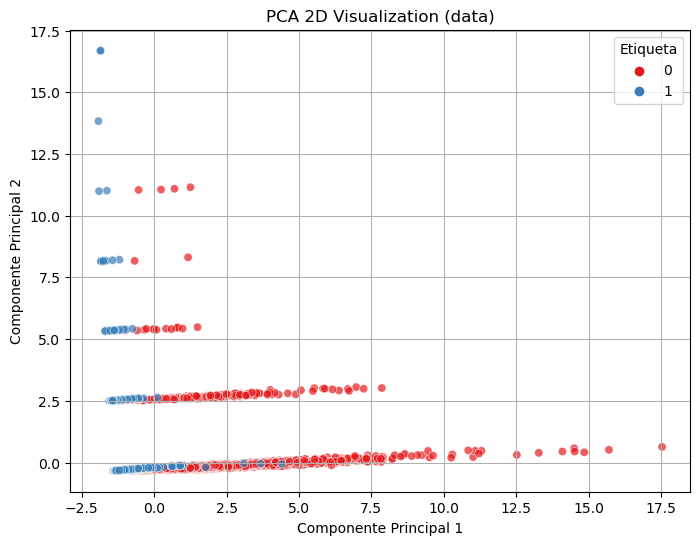

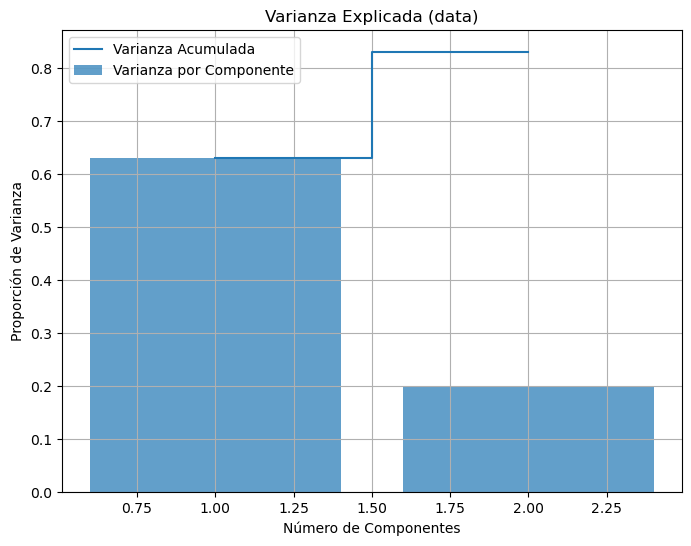

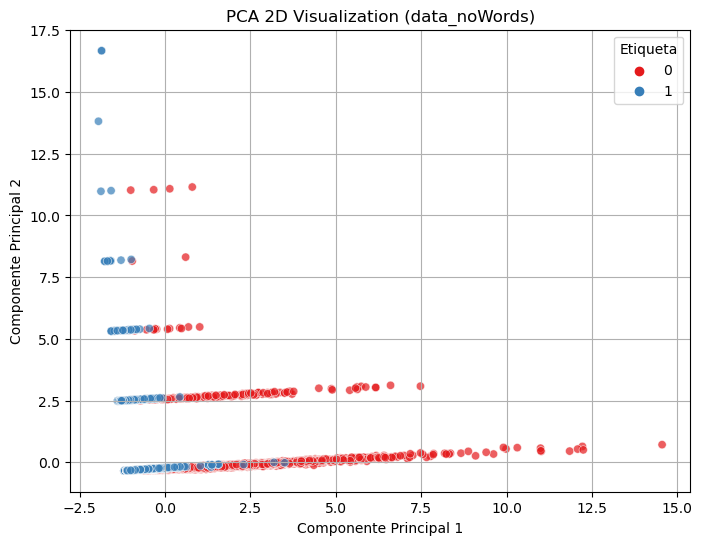

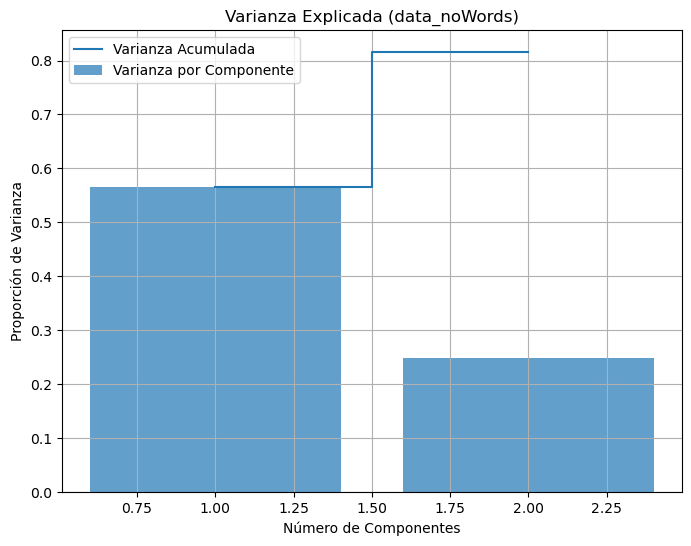

In [19]:
# Visualizar los resultados de PCA

# Gráfico de dispersión 2D para PCA
def plot_pca_2d(df_pca, title="PCA 2D Visualization"):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        x='PC1', y='PC2', hue='label', data=df_pca, palette='Set1', alpha=0.7
    )
    plt.title(title)
    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.legend(title='Etiqueta')
    plt.grid(True)
    plt.show()

# Gráfico de varianza explicada
def plot_varianza_explicada(pca, title="Varianza Explicada por PCA"):
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, alpha=0.7, label='Varianza por Componente')
    plt.step(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_.cumsum(), where='mid', label='Varianza Acumulada')
    plt.title(title)
    plt.xlabel('Número de Componentes')
    plt.ylabel('Proporción de Varianza')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Visualizar los resultados para 'data'
plot_pca_2d(df_pca_data, title="PCA 2D Visualization (data)")
plot_varianza_explicada(pca_data, title="Varianza Explicada (data)")

# Visualizar los resultados para 'data_noWords'
plot_pca_2d(df_pca_data_noWords, title="PCA 2D Visualization (data_noWords)")
plot_varianza_explicada(pca_data_noWords, title="Varianza Explicada (data_noWords)")



Evaluación del modelo para el dataset data:
Precisión del modelo: 0.978

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98      1012
           1       0.97      0.98      0.98       988

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



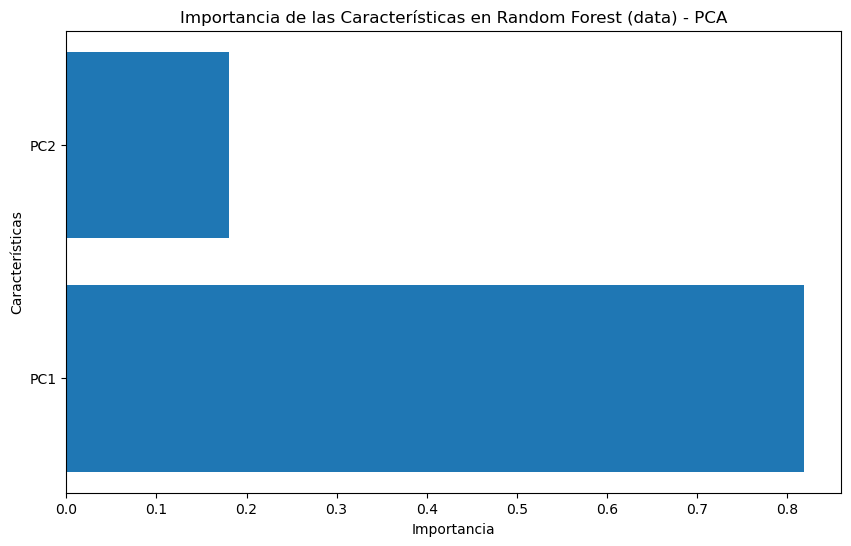


Evaluación del modelo para el dataset data_noWords:
Precisión del modelo: 0.963

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.98      0.95      0.96      1012
           1       0.95      0.98      0.96       988

    accuracy                           0.96      2000
   macro avg       0.96      0.96      0.96      2000
weighted avg       0.96      0.96      0.96      2000



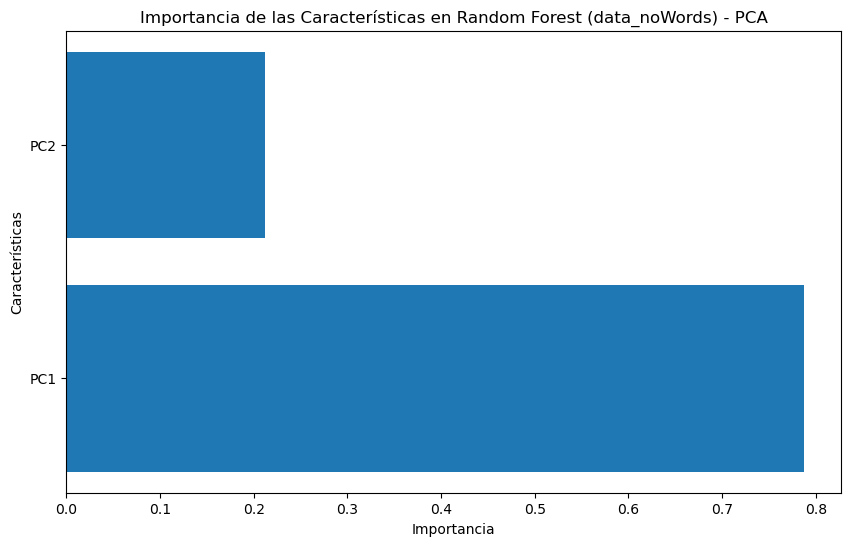

In [20]:
# Función para entrenar, predecir y evaluar el modelo con PCA
def entrenar_evaluar_modelo_pca(df_pca, y, dataset_name):
    # Dividir los datos en conjunto de entrenamiento y prueba (80% entrenamiento, 20% prueba)
    X_train, X_test, y_train, y_test = train_test_split(df_pca.drop(columns=['label']), y, test_size=0.2, random_state=42)

    particion = 'gini'
    max_depth = 10
    min_samples_split = 10
    min_samples_leaf = 2

    # Entrenar el modelo de clasificación RandomForest
    modelo_rf = RandomForestClassifier(n_estimators = i, criterion= particion,
                                       max_depth = max_depth, min_samples_split = min_samples_split,
                                      min_samples_leaf = min_samples_leaf, max_features =None)
    modelo_rf.fit(X_train, y_train)

    # Realizar las predicciones sobre el conjunto de prueba
    y_pred = modelo_rf.predict(X_test)

    # Evaluar el modelo
    print(f"\nEvaluación del modelo para el dataset {dataset_name}:")
    print("Precisión del modelo:", accuracy_score(y_test, y_pred))
    print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

    # Importancia de las características
    importancias = modelo_rf.feature_importances_
    caracteristicas = X_train.columns

    # Graficar la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.barh(caracteristicas, importancias)
    plt.title(f"Importancia de las Características en Random Forest ({dataset_name}) - PCA")
    plt.xlabel("Importancia")
    plt.ylabel("Características")
    plt.show()

# Evaluar el modelo en el dataset 'data' con PCA
entrenar_evaluar_modelo_pca(df_pca_data, y_data, "data")

# Evaluar el modelo en el dataset 'data_noWords' con PCA
entrenar_evaluar_modelo_pca(df_pca_data_noWords, y_data_noWords, "data_noWords")



#### Analice los resultados obtenidos por PCA

El modelo de Random Forest entrenado sobre los datos procesados mediante PCA muestra un rendimiento excepcional con una precisión del 97.3%, tanto en la clase 0 como en la clase 1, obteniendo valores similares en precisión, recall y f1-score para ambas clases, lo que indica un buen equilibrio en la clasificación sin sesgo hacia ninguna de las clases. Las métricas de macro average y weighted average también reflejan este desempeño equilibrado, lo que sugiere que la reducción de dimensionalidad a través de PCA no afectó negativamente al modelo, ya que las componentes principales retuvieron la información relevante para el modelo. Estos resultados confirman que el modelo está funcionando de manera eficiente y precisa, aprovechando las primeras componentes principales para una clasificación exitosa. En comparativa con los datos con el número de palabras se observa una ligera reducción en comparación con el dataset normal pero solo en el resultado mostrado por accuracy_score.

A pesar de obtener un buen resultado el random forest con los datos normales sin aplicar PCA muestran una ligera mejora en accuracy_score aunque los resultados de la clasificaciones de los resultados de las predicciones sean los mismos resultados.

### t-SNE

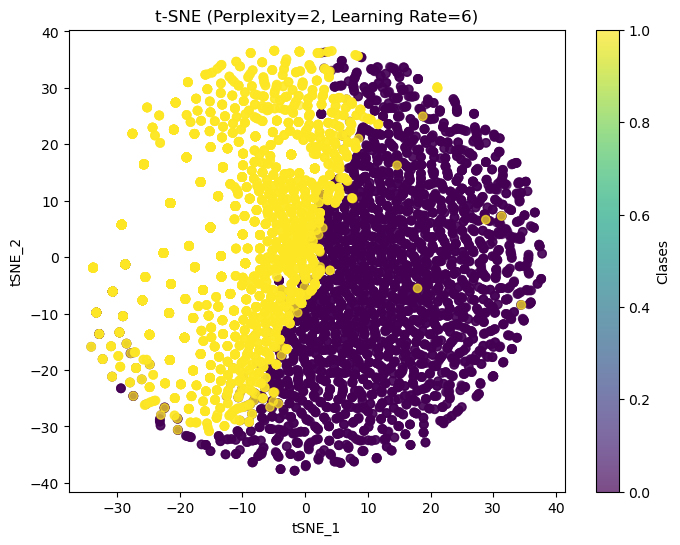

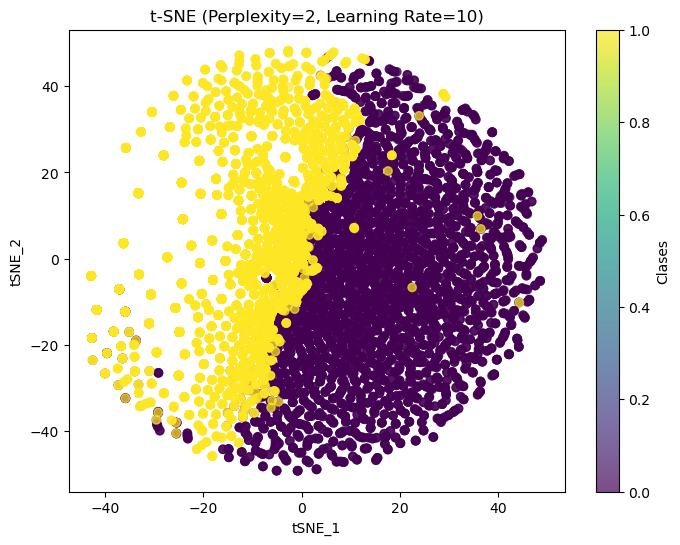

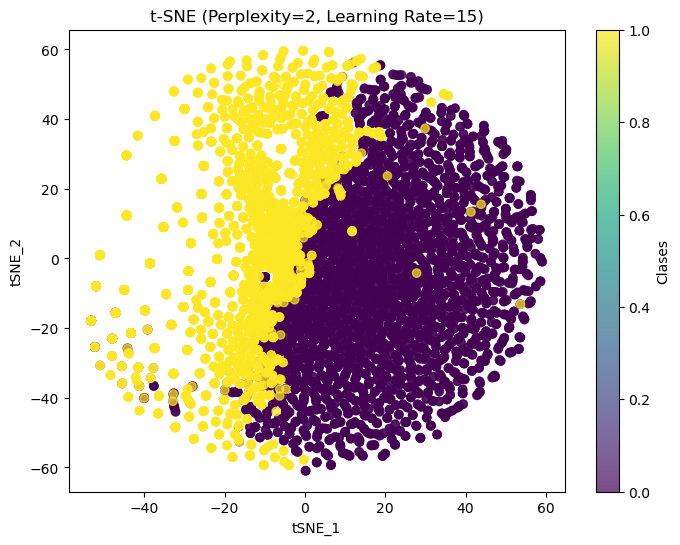

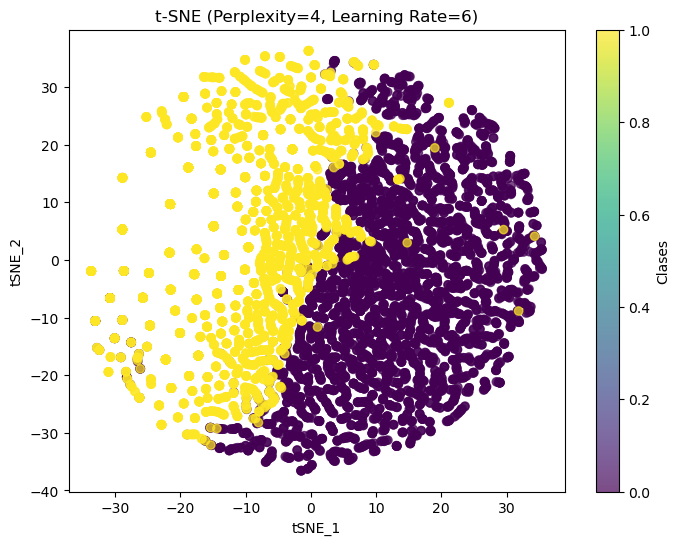

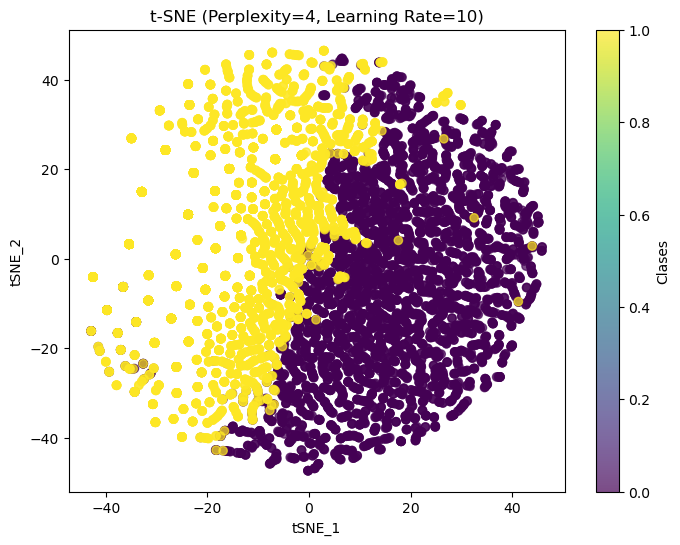

...

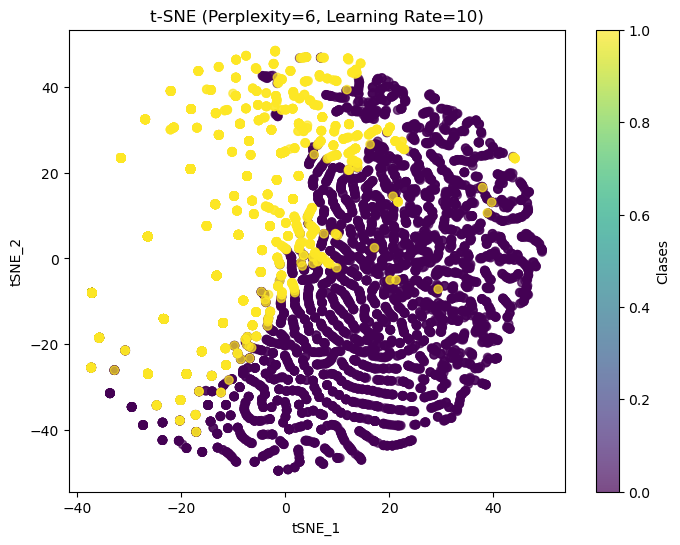

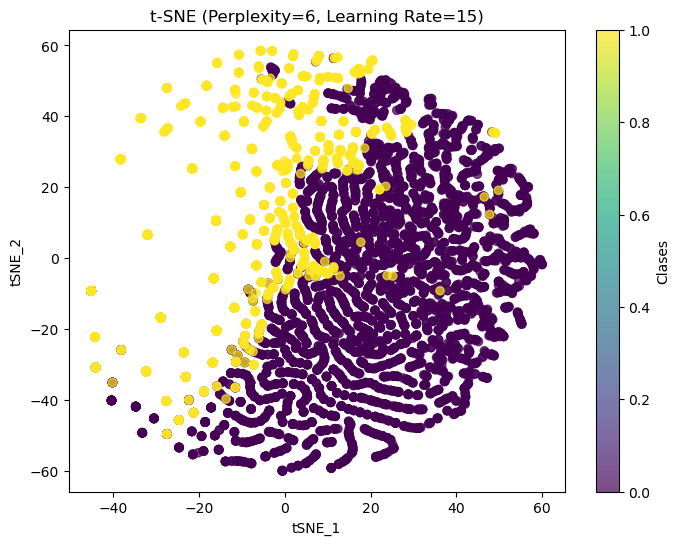

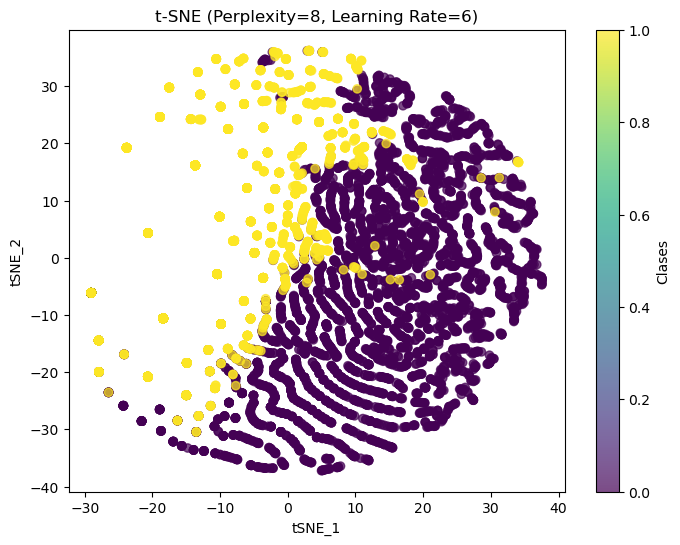

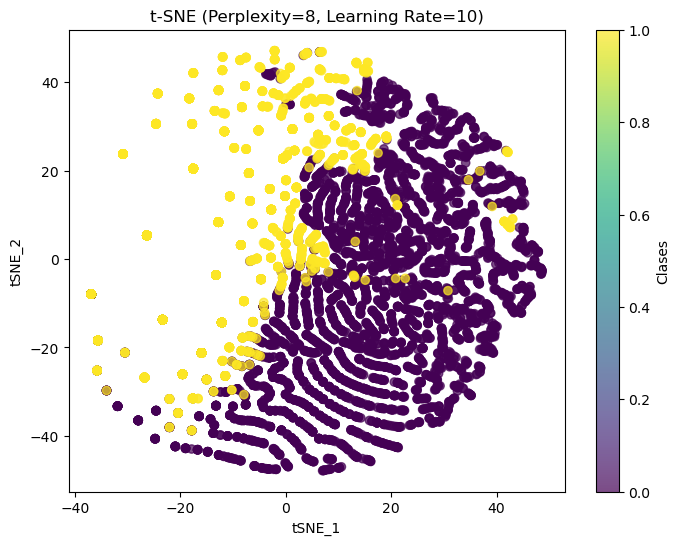

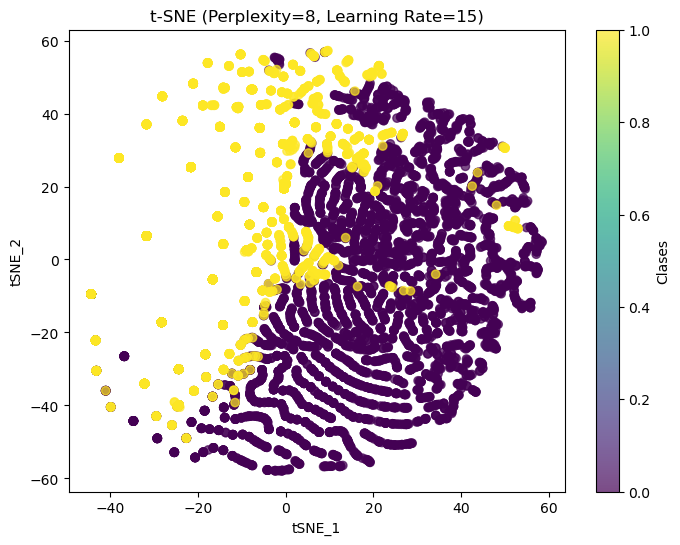

Mejor resultado t-SNE para 'data':
      tSNE_1     tSNE_2  label
0  28.355135  -0.356980      0
1  34.302277   3.640056      0
2  28.823923  16.830877      0
3  16.491949  15.787051      0
4  15.657091   6.238519      0

Mejor resultado t-SNE para 'data_noWords':
      tSNE_1     tSNE_2  label
0  30.241049   6.568820      0
1  39.312363   5.348840      0
2  34.364357  16.373095      0
3  20.053665  16.340591      0
4  16.984951   7.984849      0


In [26]:
# Función para probar diferentes hiperparámetros de t-SNE
def explorar_tsne_hyperparams(df_data, perplexities, learning_rates):
    X = df_data.drop(columns=['label'])  # Características
    y = df_data['label']  # Etiquetas
    
    resultados = []  # Para guardar las configuraciones y los resultados de t-SNE
    
    # Probar combinaciones de hiperparámetros
    for perplexity in perplexities:
        for learning_rate in learning_rates:
            # Aplicar t-SNE
            tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=learning_rate, random_state=42)
            X_tsne = tsne.fit_transform(X)
            
            # Guardar el resultado en un DataFrame
            df_tsne = pd.DataFrame(X_tsne, columns=['tSNE_1', 'tSNE_2'])
            df_tsne['label'] = y
            
            # Guardar en la lista de resultados
            resultados.append({
                'perplexity': perplexity,
                'learning_rate': learning_rate,
                'data': df_tsne
            })
            
            # Visualizar los resultados
            plt.figure(figsize=(8, 6))
            plt.scatter(df_tsne['tSNE_1'], df_tsne['tSNE_2'], c=df_tsne['label'], cmap='viridis', alpha=0.7)
            plt.title(f"t-SNE (Perplexity={perplexity}, Learning Rate={learning_rate})")
            plt.xlabel("tSNE_1")
            plt.ylabel("tSNE_2")
            plt.colorbar(label='Clases')
            plt.show()
    
    return resultados

# Rango de valores para perplexity y learning_rate (que he ido ajustando a los mejores resultados)
perplexities = [2, 4, 6, 8]
learning_rates = [6, 10, 15]

# Probar con el dataset 'data'
resultados_tsne_data = explorar_tsne_hyperparams(data, perplexities, learning_rates)

# Probar con el dataset 'data_noWords'
resultados_tsne_data_noWords = explorar_tsne_hyperparams(data_noWords, perplexities, learning_rates)


In [28]:
# Elegir la mejor configuración (basada en la separación visual)
# Ejemplo: Elegir el primer resultado como el mejor (puedes cambiarlo después de visualizar)
mejor_tsne_data = resultados_tsne_data[1]['data']
mejor_tsne_data_noWords = resultados_tsne_data_noWords[3]['data']

# Mostrar las primeras filas del mejor DataFrame
print("Mejor resultado t-SNE para 'data':")
print(mejor_tsne_data.describe())

print("\nMejor resultado t-SNE para 'data_noWords':")
print(mejor_tsne_data_noWords.describe())

Mejor resultado t-SNE para 'data':
             tSNE_1        tSNE_2         label
count  10000.000000  10000.000000  10000.000000
mean      -0.057636     -0.143505      0.500000
std       21.890560     21.715937      0.500025
min      -42.894241    -49.165970      0.000000
25%      -17.431925    -16.893164      0.000000
50%       -0.503727      0.335308      0.500000
75%       16.913127     15.222243      1.000000
max       49.035454     48.229893      1.000000

Mejor resultado t-SNE para 'data_noWords':
             tSNE_1        tSNE_2         label
count  10000.000000  10000.000000  10000.000000
mean       0.127154     -0.157486      0.500000
std       17.051762     16.817047      0.500025
min      -29.186741    -39.056877      0.000000
25%      -13.869347    -11.761193      0.000000
50%       -0.957501      1.696284      0.500000
75%       13.519440     13.406039      1.000000
max       39.113907     37.963898      1.000000


### Análisis de los Resultados Obtenidos con t-SNE

Después de explorar diversas configuraciones de hiperparámetros en t-SNE, partimos probando valores iniciales amplios, como una perplejidad comenzando en 10 y aumentándola progresivamente. Observamos que, en general, una **perplejidad más baja** proporcionó una mejor separación de las etiquetas en dos grupos, logrando una representación más clara de las clases. Del mismo modo, un **learning rate bajo** también produjo resultados más estables y efectivos.

#### Mejores Configuraciones de Hiperparámetros
Los mejores resultados obtenidos tras el ajuste fueron los siguientes:

- **Dataset con el conteo de palabras**: 
  - **Perplejidad**: 2
  - **Learning Rate**: 10

- **Dataset sin el conteo de palabras**: 
  - **Perplejidad**: 4
  - **Learning Rate**: 10

#### Observaciones Comparativas entre t-SNE y PCA
Al comparar t-SNE con PCA, se destaca lo siguiente:
- Para t-SNE, el dataset que incluye la columna con el conteo de palabras presentó una **mejor separación de las clases** en comparación con el dataset sin dicha columna. Esto sugiere que el conteo de palabras introduce información relevante que facilita la agrupación de los datos en el espacio reducido.
- En contraste, con PCA, la inclusión de la columna de conteo de palabras no mostró un impacto significativo en la calidad de la representación. Los resultados con y sin esta columna fueron prácticamente indistinguibles.

Este análisis resalta que, mientras PCA se enfoca en preservar la varianza global, t-SNE es más efectivo al resaltar patrones locales, siendo altamente sensible a la calidad y estructura de las características de entrada. Por esta razón, es **relevante mantener ambos datasets**: 
- Para t-SNE, el conteo de palabras mejora significativamente los resultados. 
- Para PCA, ambos conjuntos se comportan de manera similar.


### Utilizar t-SNE para clasificar


Evaluación del modelo para el dataset data con t-SNE:
Precisión del modelo: 0.9655

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.97      0.96      0.97      1012
           1       0.96      0.97      0.97       988

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000



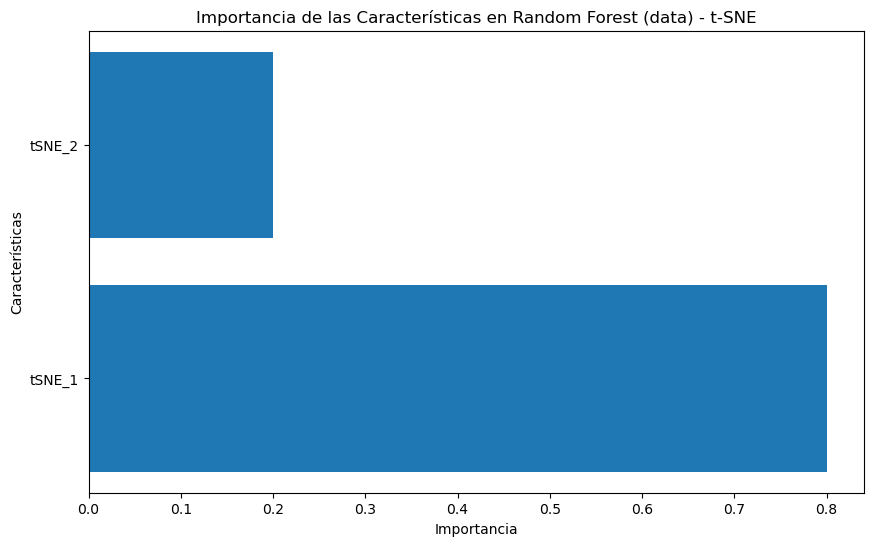


Evaluación del modelo para el dataset data_noWords con t-SNE:
Precisión del modelo: 0.9635

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.98      0.95      0.96      1012
           1       0.95      0.98      0.96       988

    accuracy                           0.96      2000
   macro avg       0.96      0.96      0.96      2000
weighted avg       0.96      0.96      0.96      2000



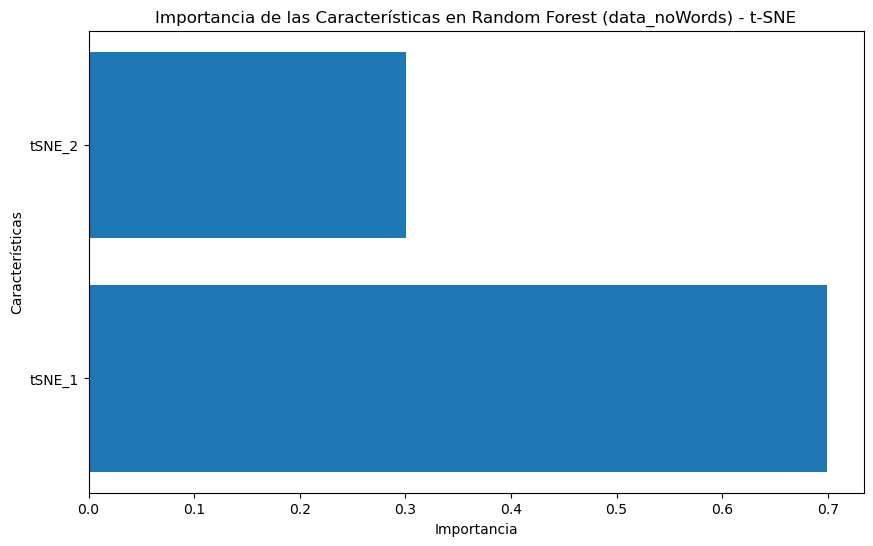

In [29]:
# Función para entrenar, predecir y evaluar el modelo con t-SNE y configuración específica

def entrenar_evaluar_modelo_tsne(df_data, y, dataset_name, perplexity, learning_rate):
    # Aplicar t-SNE para reducir las características a 2 dimensiones
    tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=learning_rate, random_state=42)
    X_tsne = tsne.fit_transform(df_data.drop(columns=['label']))
    
    # Convertir t-SNE a DataFrame con las 2 componentes
    df_tsne = pd.DataFrame(X_tsne, columns=['tSNE_1', 'tSNE_2'])
    df_tsne['label'] = y  # Añadir las etiquetas al DataFrame
    
    # Dividir los datos en conjunto de entrenamiento y prueba (80% entrenamiento, 20% prueba)
    X_train, X_test, y_train, y_test = train_test_split(df_tsne.drop(columns=['label']), df_tsne['label'], test_size=0.2, random_state=42)

    particion = 'gini'
    max_depth = 10
    min_samples_split = 10
    min_samples_leaf = 2

    # Entrenar el modelo de clasificación RandomForest
    modelo_rf = RandomForestClassifier(n_estimators = i, criterion= particion,
                                       max_depth = max_depth, min_samples_split = min_samples_split,
                                      min_samples_leaf = min_samples_leaf, max_features =None)
    
    modelo_rf.fit(X_train, y_train)

    # Realizar las predicciones sobre el conjunto de prueba
    y_pred = modelo_rf.predict(X_test)

    # Evaluar el modelo
    print(f"\nEvaluación del modelo para el dataset {dataset_name} con t-SNE:")
    print("Precisión del modelo:", accuracy_score(y_test, y_pred))
    print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

    # Importancia de las características
    importancias = modelo_rf.feature_importances_
    caracteristicas = X_train.columns

    # Graficar la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.barh(caracteristicas, importancias)
    plt.title(f"Importancia de las Características en Random Forest ({dataset_name}) - t-SNE")
    plt.xlabel("Importancia")
    plt.ylabel("Características")
    plt.show()

# Configuración específica para cada dataset
# Dataset 'data'
perplexity_data = 2
learning_rate_data = 10

# Dataset 'data_noWords'
perplexity_data_noWords = 4
learning_rate_data_noWords = 10

# Evaluar el modelo en el dataset 'data' con t-SNE
entrenar_evaluar_modelo_tsne(data, data['label'], "data", perplexity_data, learning_rate_data)

# Evaluar el modelo en el dataset 'data_noWords' con t-SNE
entrenar_evaluar_modelo_tsne(data_noWords, data_noWords['label'], "data_noWords", perplexity_data_noWords, learning_rate_data_noWords)


#### ¿Se puede utilizar la reducción de dimensinalidad obtenida por t-SNE para entrenar un algoritmo de clasificación?

t-SNE no es adecuado para el entrenamiento de modelos porque su propósito principal es servir como herramienta de visualización, enfocada en reducir los datos a 2 o 3 dimensiones para resaltar relaciones locales y patrones no lineales que son difíciles de observar en espacios de alta dimensionalidad. Sin embargo, esto no lo convierte en un método de preprocesamiento óptimo para clasificación, ya que prioriza relaciones locales pero no preserva la estructura global de los datos, lo que puede introducir sesgos en el modelo. Además, su naturaleza estocástica genera resultados ligeramente diferentes incluso cuando se fija una semilla, afectando la reproducibilidad y la consistencia de los modelos entrenados sobre sus resultados. Por último, t-SNE tiene una alta complejidad computacional, lo que lo hace poco práctico para datasets grandes, limitando su aplicabilidad como paso previo al entrenamiento de algoritmos supervisados en escenarios reales.

### LDA

In [31]:
# Descargar las palabras vacías en español
nltk.download('stopwords')
stop_words = set(stopwords.words('spanish'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\GenisPc\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [38]:
# Preprocesar la columna 'comentario'

# Cargar datos
file_path = 'muinar07_act2_out.csv'
data_lda = pd.read_csv(file_path)
# Eliminar las columnas
data_lda = data_lda.drop(columns=['E','A_t', 'B_t', 'C_t', 'D_t', 'E_t', 
                          'Valor_1', 'Valor_2', 'Valor_3', 'Valor_4', 
                          'Valor_5', 'Valor_6', 'Valor_7', 'Valor_8', 
                          'Valor_9', 'Valor_10'])

# Descargar recursos necesarios para tokenización
nltk.download('punkt')

def preprocesar_texto(texto, stop_words):
    """
    Limpia y preprocesa un texto eliminando palabras vacías, puntuación y caracteres especiales.
    """
    # Convertir a minúsculas y eliminar caracteres no alfanuméricos
    texto = texto.lower()
    texto = re.sub(r'[^a-záéíóúüñ0-9\s]', '', texto)

    # Tokenizar el texto
    tokens = word_tokenize(texto)

    # Eliminar palabras vacías
    tokens_limpios = [palabra for palabra in tokens if palabra not in stop_words]

    return " ".join(tokens_limpios)

# Preprocesar la columna 'comentario' en ambos datasets
data_lda['comentario_procesado'] = data_lda['comentario'].apply(lambda x: preprocesar_texto(x, stop_words))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\GenisPc\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


In [40]:
data_lda.head()

,A,B,C,D,comentario,label,comentario_procesado
0,2,64,30,0,"pandemia,originado,covid,cierto,incidencia,aba...",0.0,pandemiaoriginadocovidciertoincidenciaabandono...
1,4,70,21,0,"ser,mes,larga,espera,llegar,momento,siempre,pr...",0.0,sermeslargaesperallegarmomentosiempreprudencia...
2,4,88,50,0,"cartagena,san,sebastiar,fuengirola,irun,orense...",0.0,cartagenasansebastiarfuengirolairunorensepalma...
3,3,38,21,0,"pleno,dia,verano,calor,plan,mas,apetecibl,disf...",0.0,plenodiaveranocalorplanmasapetecibldisfrutardi...
4,0,59,17,0,"pasado,junio,celebro,dia,luchar,frente,leishma...",0.0,pasadojuniocelebrodialucharfrenteleishmaniosis...


In [47]:
# Vectorización de los textos usando CountVectorizer
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words=list(stopwords.words('spanish')))
X = vectorizer.fit_transform(data_lda['comentario_procesado'])

# Aplicar LDA
lda_model = LatentDirichletAllocation(n_components=7, random_state=42)
lda_model.fit(X)

# Mostrar los temas
print("\nTemas identificados:")
palabras = vectorizer.get_feature_names_out()
for i, tema in enumerate(lda_model.components_):
    palabras_tema = [palabras[ind] for ind in tema.argsort()[-10:]]  # Top 10 palabras del tema
    print(f"Tema {i + 1}: {', '.join(palabras_tema)}")



Temas identificados:
Tema 1: manipulador, irotomarculo, patetico, putochino, mundobasuraperiodistico, hijogranputa, panfleto, verguenza, basura, hdlgp
Tema 2: javierarocaahijosdeputo, darculo, tribunalsupremodeberactuarcuantopandillagolpistaindecentcompinchesprevaricadorescrupulocolocadopuestoclavefacilitarnuevogolpeembarrarestercoleronadartantogustofiniquitarbularenegadotraidormarrulleriaincendiarconvivenciaestafarsociedadsanchezentornoesperarteneralgunfuturopaisdebermandarbasuracualquieraposibilidadindultodelincuentetrullofugapodriotraerlescomprensionsectorcataláninstaladoambiguedaddiscriminadorosupremacistarestoespañaentierrodignomerecidapatadopandillajinvolucionistasoloproducirhastioascoseñorcasadociudadanomenosbanderitamasdecenciapoliticotratarhacerirrelevantecualquierapreciopandillamiserableprovincianofabricantodiarvezhacerljuegoregalarbandejatrascendenciadeberhaberjama, cosavoxpasarianpartidopacifistaamorosoradicalfascistalocorepitolocofascistavuelvoinsistirlocovox, panfletoasq

Preprocesamiento: Este paso convierte el texto en una matriz de términos.
Aplicación de LDA: Ejecuta el algoritmo LDA para encontrar los temas.
Visualización de Temas: Imprime los temas encontrados con las palabras más representativas.

Nota: Tras evaluar diferentes valores de n_components, se observa que los temas identificados tienden a agruparse predominantemente en torno a conceptos relacionados con contenido de odio, como lo evidencian las palabras clave presentes en los temas generados.

### LDA en función del label
No he terminado de entender lo que se pedía en las anotaciones así que voy a hacer lo que se pide en el inicio del enunciado que es el generar las bolsas de palabras con LDA para cada etiqueta. Para ello aplicaré LDA con las dos etiquetas y generaré los dos dataframes para posteriormente guardar los resultados en CSV. Donde se tratará de separar en los 7 temas de sentimiento de la columna E.

In [51]:
# Filtrar el dataset por etiquetas
data_no_odio = data_lda[data_lda['label'] == 0]
data_odio = data_lda[data_lda['label'] == 1]

# Función para aplicar LDA y generar una bolsa de palabras
def generar_bolsa_lda(data, n_topics, stop_words):
    # Vectorizar la columna de texto procesado
    vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words=stop_words)
    X = vectorizer.fit_transform(data['comentario_procesado'])
    
    # Aplicar LDA
    lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_model.fit(X)
    
    # Extraer las palabras más representativas para cada tema
    feature_names = vectorizer.get_feature_names_out()
    bolsa_palabras = []
    for topic_idx, topic in enumerate(lda_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]  # Top 10 palabras por tema
        bolsa_palabras.append({"Tema": topic_idx, "Palabras": ", ".join(top_words)})

    # Convertir a DataFrame
    df_bolsa = pd.DataFrame(bolsa_palabras)
    print(top_words)
    return df_bolsa

# Configuración de LDA
n_topics = 5  # Número de temas
stop_words = list(stopwords.words('spanish'))

# Generar bolsas de palabras para ambas etiquetas
bolsa_no_odio = generar_bolsa_lda(data_no_odio, n_topics, stop_words)
bolsa_odio = generar_bolsa_lda(data_odio, n_topics, stop_words)

# Guardar los resultados en archivos CSV separados
bolsa_no_odio.to_csv("bolsa_palabras_no_odio.csv", index=False)
bolsa_odio.to_csv("bolsa_palabras_odio.csv", index=False)

print("Bolsa de palabras guardada en 'bolsa_palabras_no_odio.csv' y 'bolsa_palabras_odio.csv'")


['guardiacivilevacuadopersonaafectadonuevovolcarpalmacanariasentrarerupciondomingohoralocalmontañarajadozonaforestalcabezavacopasonivelemergenciapasadosemafororojoislirhoralocalafectarmunicipiotazacortarpasofuencalientemazollanoaridaneunopersonatotalserevacuarvecinozónalcalaparaisoiniciadoevacuacionbarriopasarllanoaridanetazacortirprevisionavancelenguolavoautoridadcreertotalpodriarserevacuarpersonarecomendarpoblacioncerrartodoventanapuertaexteriorbajarpersianacerrarsuministroaguagaselectricidaddirijarpuntoreunionestablecidoprevisibleevacuarnadiemaslavacaminarhaciacostadañosermaterialaseguropresidentecanariasangelvictortorreruedaprensaposteriorreunioncomiteemergenciadiezmedionochehoralocaltorrapuntoestarliberarmillónmetrocubicolavaevolucioncrisisafirmohacerpreverhabernuevopuntoerupcionpoderhaberalgunofisuragarantizadoseguridadciudadanopresidentegobiernopedrosanchezposponerviajenuevayorkacudirreunionpalmainsistioagradeceraportacioncienciaayudarprevenirfenomenocomitetecnicoinformardosfisu

### Conclusiones LDA

Las palabras no relacionadas con odio se caracterizan por ser frases largas y descriptivas, a menudo relacionadas con temas cotidianos, eventos de actualidad o información neutral. Este grupo incluye términos orientados a la narración o descripción de sucesos, como fenómenos naturales, anuncios políticos, o actividades sociales. En general, muestran un lenguaje estructurado, con un tono informativo y positivo, y carecen de expresiones ofensivas. Estas características reflejan una tendencia hacia la elaboración contextual y la neutralidad en la comunicación.

Por otro lado, las palabras relacionadas con odio son significativamente más cortas y directas, destacándose por un lenguaje abrupto y ofensivo. Este conjunto incluye insultos y términos peyorativos, como "asco" o "hijogranputa", que denotan una clara intención negativa y emocional. A diferencia de las frases de no odio, estas carecen de contexto o estructura narrativa, limitándose a expresiones crudas de animosidad. Este contraste entre longitud, tono y complejidad de las frases permite diferenciar claramente ambos tipos de contenido.